#### Ref:
1. https://www.tensorflow.org/tutorials/generative/cyclegan

In [1]:
import os
import cv2
import time
import random
import warnings
import numpy as np
import matplotlib.pyplot as plt
from IPython import display

In [2]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
import tensorflow_datasets as tfds

In [3]:
warnings.filterwarnings("ignore")
tf.__version__

'2.4.0'

---
#### Call out GPU

In [4]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the fourth GPU
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


---
#### Parameter Settings

In [5]:
IMGWD = 256
IMGHG = 256
CHANNEL = 3

LAMBDA = 10
BUFFER_SIZE = 60000
BATCH_SIZE = 1
EPOCHS = 200
LEARNING_RATE = 2e-04
AUTOTUNE = tf.data.experimental.AUTOTUNE

CHKPOINT_DIR = 'checkpoints/CycleGAN/'

for _dir in [CHKPOINT_DIR]:
    if not os.path.isdir(_dir):
        os.makedirs(_dir)

---
#### Preprocessing Functions

In [6]:
def random_crop(image):
    cropped = tf.image.random_crop(image, size=[IMGHG, IMGWD, CHANNEL])
    return cropped

def normalize(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

def random_jitter(image):
    image = tf.image.resize(image, [286, 286], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = random_crop(image)
    image = tf.image.random_flip_left_right(image)
    return image

In [7]:
def preprocessing_train(image, label):
    image = random_jitter(image)
    image = normalize(image)
    return image

def preprocessing_test(image, label):
    image = normalize(image)
    return image

---
#### Load Datasets

In [8]:
dataset, metadata = tfds.load('cycle_gan/summer2winter_yosemite', with_info=True, as_supervised=True)
train_summers, train_winters = dataset['trainA'], dataset['trainB']
test_summers, test_winters = dataset['testA'], dataset['testB']

In [9]:
train_summers = train_summers.map(preprocessing_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_winters = train_winters.map(preprocessing_train, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
test_summers = test_summers.map(preprocessing_test, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
test_winters = test_winters.map(preprocessing_test, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

---
#### Show Some Samples

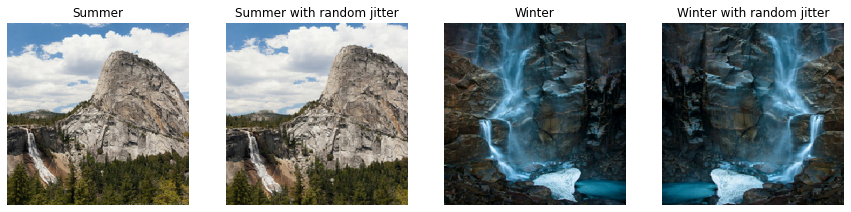

In [10]:
sample_summer = next(iter(train_summers))
sample_winter = next(iter(train_winters))

plt.figure(figsize=(15,5))

plt.subplot(1,4,1)
plt.title('Summer')
plt.imshow(sample_summer[0] * 0.5 + 0.5)
plt.axis('off')

plt.subplot(1,4,2)
plt.title('Summer with random jitter')
plt.imshow(random_jitter(sample_summer[0]) * 0.5 + 0.5)
plt.axis('off')

plt.subplot(1,4,3)
plt.title('Winter')
plt.imshow(sample_winter[0] * 0.5 + 0.5)
plt.axis('off')

plt.subplot(1,4,4)
plt.title('Winter with random jitter')
plt.imshow(random_jitter(sample_winter[0]) * 0.5 + 0.5)
plt.axis('off')

plt.show()

---
#### Build Model
There are 2 generators (G and F) and 2 discriminators (X and Y) being trained here. 

* Generator `G` learns to transform image `X` to image `Y`. $(G: X -> Y)$
* Generator `F` learns to transform image `Y` to image `X`. $(F: Y -> X)$
* Discriminator `D_X` learns to differentiate between image `X` and generated image `X` (`F(Y)`).
* Discriminator `D_Y` learns to differentiate between image `Y` and generated image `Y` (`G(X)`).

Note: Uses Instance normalization instead of batch normalization

![Cyclegan model](img/cyclegan_model.jpg)
The figure above taken from https://www.tensorflow.org/tutorials/generative/cyclegan

***1. The Generator***

In [11]:
class down_sample():
    def __init__(self, filters, size, apply_instancenorm=True):
        self.filters = filters
        self.size = size
        self.apply_instancenorm = apply_instancenorm
        self.initializer = tf.random_normal_initializer(0., 0.02)
        
    def __call__(self, inputs):
        x = layers.Conv2D(self.filters, self.size, strides=2, padding='same',
                          kernel_initializer=self.initializer, use_bias=False)(inputs)
        
        if self.apply_instancenorm == True:
            x = tfa.layers.InstanceNormalization()(x)
        x = layers.LeakyReLU()(x)
        
        return x

In [12]:
class up_sample():
    def __init__(self, filters, size, apply_dropout=False):
        self.filters = filters
        self.size = size
        self.apply_dropout = apply_dropout
        self.initializer = tf.random_normal_initializer(0., 0.02)
        
    def __call__(self, inputs):
        x = layers.Conv2DTranspose(self.filters, self.size, strides=2, padding='same',
                                   kernel_initializer=self.initializer, use_bias=False)(inputs)
        x = tfa.layers.InstanceNormalization()(x)
        
        if self.apply_dropout == True:
            x = layers.Dropout(0.5)(x)
        x = layers.ReLU()(x)
        
        return x

In [13]:
def generator_model():
    inputs = keras.Input(shape=(IMGHG, IMGWD, CHANNEL))
    initializer = tf.random_normal_initializer(0., 0.02)
    
    down_stack = [
        down_sample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        down_sample(128, 4),                       # (bs, 64, 64, 128)
        down_sample(256, 4),                       # (bs, 32, 32, 256)
        down_sample(512, 4),                       # (bs, 16, 16, 512)
        down_sample(512, 4),                       # (bs, 8, 8, 512)
        down_sample(512, 4),                       # (bs, 4, 4, 512)
        down_sample(512, 4),                       # (bs, 2, 2, 512)
        down_sample(512, 4)                        # (bs, 1, 1, 512)
    ]
    
    up_stack = [
        up_sample(512, 4, apply_dropout=True),     # (bs, 2, 2, 1024)
        up_sample(512, 4, apply_dropout=True),     # (bs, 4, 4, 1024)
        up_sample(512, 4, apply_dropout=True),     # (bs, 8, 8, 1024)
        up_sample(512, 4),                         # (bs, 16, 16, 1024)
        up_sample(256, 4),                         # (bs, 32, 32, 512)
        up_sample(128, 4),                         # (bs, 64, 64, 256)
        up_sample(64, 4)                           # (bs, 128, 128, 128)
    ]
    
    skips = []
    x = inputs
    # Downsampling through the model
    for ds in down_stack:
        x = ds(x)
        skips.append(x)
        
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections
    for us, skip in zip(up_stack, skips):
        x = us(x)
        x = tf.keras.layers.Concatenate()([x, skip])
        
    outputs = layers.Conv2DTranspose(CHANNEL, 4, strides=2, padding='same',
                                     kernel_initializer=initializer, activation='tanh')(x) #(bs, 256, 256, 3)
    model = keras.Model(inputs=inputs, outputs=outputs, name='Generator')
    
    return model

***2. The Discriminator***

In [14]:
def discriminator_model():
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = keras.Input(shape=(IMGWD, IMGHG, CHANNEL))
    
    x = down_sample(64, 4, False)(inputs)         # (bs, 128, 128, 64)
    x = down_sample(128, 4)(x)               # (bs, 64, 64, 128)
    x = down_sample(256, 4)(x)               # (bs, 32, 32, 256)
    
    x = layers.ZeroPadding2D()(x)            # (bs, 34, 34, 256)
    x = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(x) # (bs, 31, 31, 512)
    x = tfa.layers.InstanceNormalization()(x)
    x = layers.LeakyReLU()(x)
    
    x = layers.ZeroPadding2D()(x)            # (bs, 33, 33, 512)
    outputs = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(x) # (bs, 30, 30, 1)
    model = keras.Model(inputs=inputs, outputs=outputs, name='Discriminator')
    
    return model

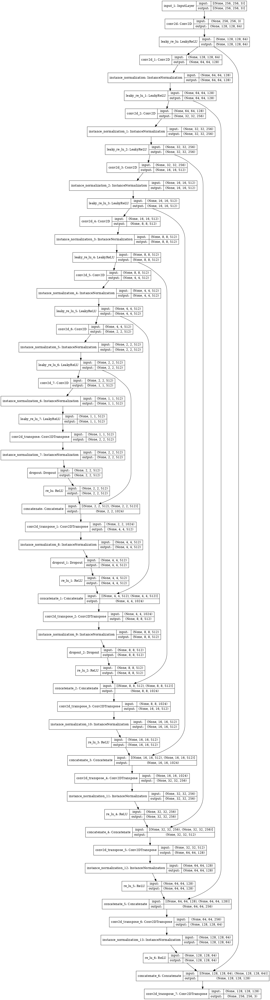

In [15]:
generator_g, generator_f = generator_model(), generator_model()
tf.keras.utils.plot_model(generator_g, show_shapes=True, dpi=64)

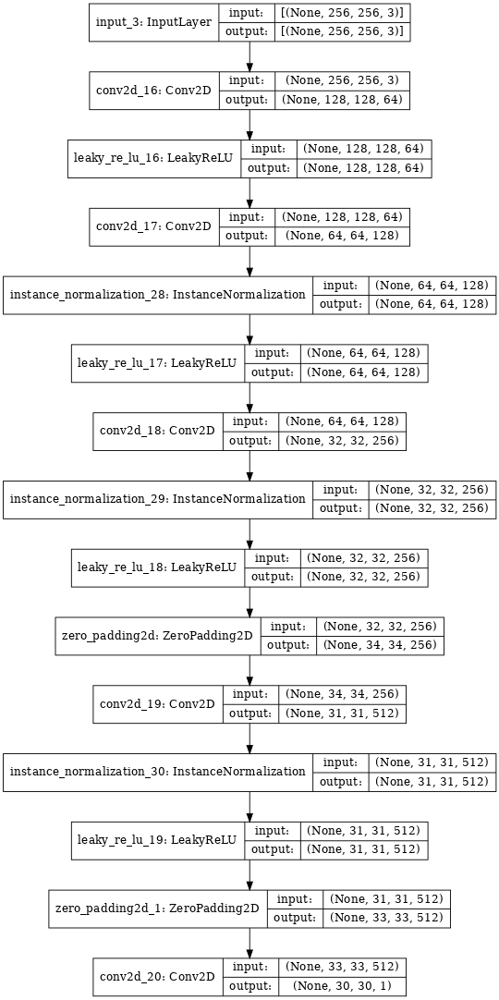

In [16]:
discriminator_x, discriminator_y = discriminator_model(), discriminator_model()
tf.keras.utils.plot_model(discriminator_x, show_shapes=True, dpi=64)

***3. Define optimizers and losses***

In [17]:
generator_g_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=0.5)

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(gen_output):
    return cross_entropy(tf.ones_like(gen_output), gen_output)

def discriminator_loss(real_output, gen_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    gen_loss = cross_entropy(tf.zeros_like(gen_output), gen_output)
    
    return (real_loss + gen_loss) * 0.5

(Copied from tf 2 cycleGAN tutorial)

In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input x and the target y pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

Cycle consistency means the result should be close to the original input. For example, if one translates a sentence from English to French, and then translates it back from French to English, then the resulting sentence should be the same as the original sentence.

In cycle consistency loss, 

* Image $X$ is passed via generator $G$ that yields generated image $\hat{Y}$.
* Generated image $\hat{Y}$ is passed via generator $F$ that yields cycled image $\hat{X}$.
* Mean absolute error is calculated between $X$ and $\hat{X}$.

$$forward\ cycle\ consistency\ loss: X -> G(X) -> F(G(X)) \sim \hat{X}$$

$$backward\ cycle\ consistency\ loss: Y -> F(Y) -> G(F(Y)) \sim \hat{Y}$$


![Cycle loss](img/cycle_loss.jpg)

In [18]:
def cycle_loss(real_image, cycled_image):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

generator $G$ is responsible for translating image $X$ to image $Y$. Identity loss says that, if you fed image $Y$ to generator $G$, it should yield the real image $Y$ or something close to image $Y$.

If you run the summer-to-winter model on a winter or the winter-to-summer model on a summer, it should not modify the image much since the image already contains the target class.

$$Identity\ loss = |G(Y) - Y| + |F(X) - X|$$

In [19]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

***4. Make Checkpoints***

In [20]:
checkpoint = tf.train.Checkpoint(generator_g_optimizer=generator_g_optimizer,
                                 generator_f_optimizer=generator_f_optimizer,
                                 discriminator_x_optimizer=discriminator_x_optimizer,
                                 discriminator_y_optimizer=discriminator_y_optimizer,
                                 generator_g=generator_g,
                                 generator_f=generator_f,
                                 discriminator_x=discriminator_x,
                                 discriminator_y=discriminator_y)

ckpt_manager = tf.train.CheckpointManager(checkpoint, CHKPOINT_DIR, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    checkpoint.restore(ckpt_manager.latest_checkpoint)
    print ('Weight Loaded!!!')

---
##### Visualization function

In [21]:
def generate_images(model, inputs):
    predicts = model(inputs, training=False)
    plt.figure(figsize=(12,12))
    
    displays = [inputs[0], predicts[0]]
    titles = ['Input Image', 'Predicted Image']
    
    for i in range(len(displays)):
        plt.subplot(1, 2, i+1)
        plt.title(titles[i])
        plt.imshow(((displays[i] + 1) * 127.5).numpy().astype(np.uint8))
        plt.axis('off')
    plt.show()

In [22]:
def training_losses(gen_f_losses, gen_g_losses, disc_x_losses, disc_y_losses, cycle_losses):
    plt.figure()
    plt.plot(range(EPOCHS), gen_f_losses, color = "blue", label = "Generator f Loss")
    plt.plot(range(EPOCHS), gen_g_losses, color = "red",  label = "Generator g Loss")
    plt.plot(range(EPOCHS), disc_x_losses, color = "green", label = "Discriminator x Loss")
    plt.plot(range(EPOCHS), disc_y_losses, color = "purple",  label = "Discriminator y Loss")
    plt.plot(range(EPOCHS), cycle_losses, color = "orange", label = "Cycle Loss")

    plt.legend(loc = "upper right")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Cycle Training Loss")
    plt.show()

---
#### Training Function
The training process consists of four basic steps:

* Get the predictions.
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

In [23]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X.
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = cycle_loss(real_x, cycled_x) + cycle_loss(real_y, cycled_y)
        
        # Total generator loss = adversarial loss + cycle loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))
    
    return [total_gen_f_loss, total_gen_g_loss, disc_x_loss, disc_y_loss, total_cycle_loss]

---
#### Training Process

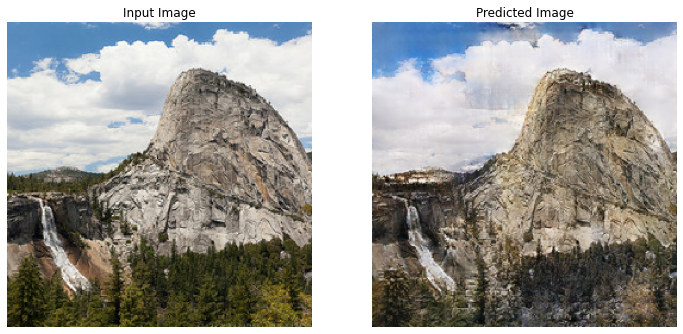

Saving checkpoint for epoch 200 at checkpoints/CycleGAN/ckpt-40
Time taken for epoch 200 is 137.53944063186646 sec



In [24]:
gen_f_losses, gen_g_losses = [], []
disc_x_losses, disc_y_losses = [], []
cycle_losses = []
for epoch in range(EPOCHS):
    start = time.time()
    
    losses = []
    for image_x, image_y in tf.data.Dataset.zip((train_summers, train_winters)):
        losses = train_step(image_x, image_y)
        
    # Record losses
    gen_f_losses.append(losses[0])
    gen_g_losses.append(losses[1])
    disc_x_losses.append(losses[2])
    disc_y_losses.append(losses[3])
    cycle_losses.append(losses[4])
        
    display.clear_output(wait=True)
    generate_images(generator_g, sample_summer)
    
    if (epoch + 1) % 5 == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch+1, ckpt_save_path))
        
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))

---
#### Training Losses Visualization

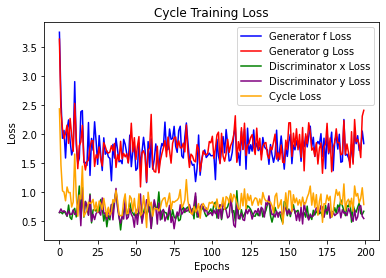

In [25]:
training_losses(gen_f_losses, gen_g_losses, disc_x_losses, disc_y_losses, cycle_losses)

---
#### Testing Process

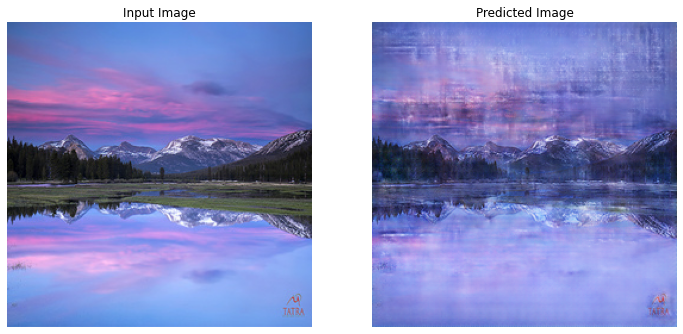

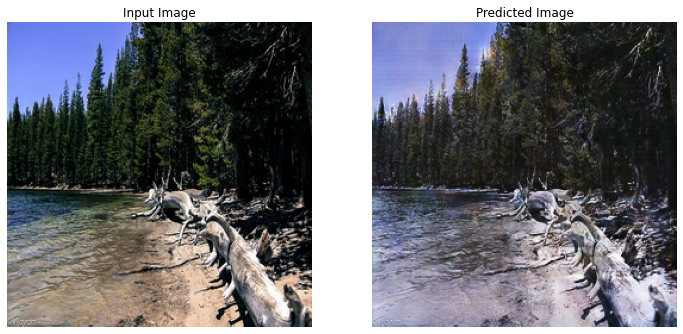

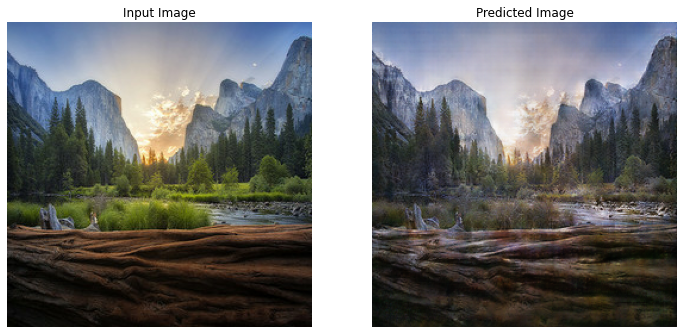

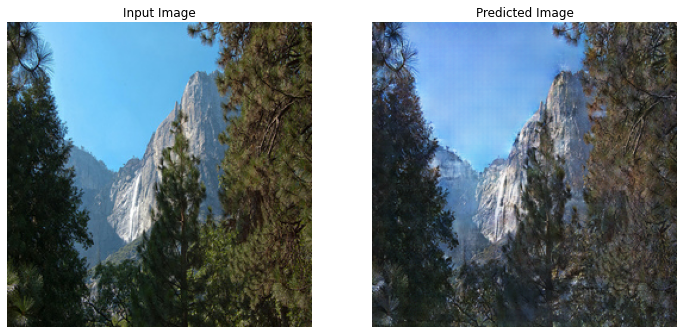

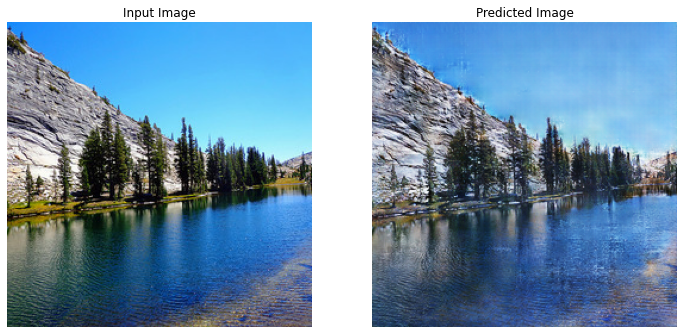

...

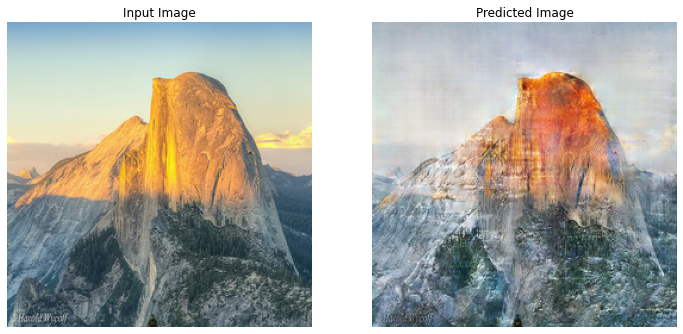

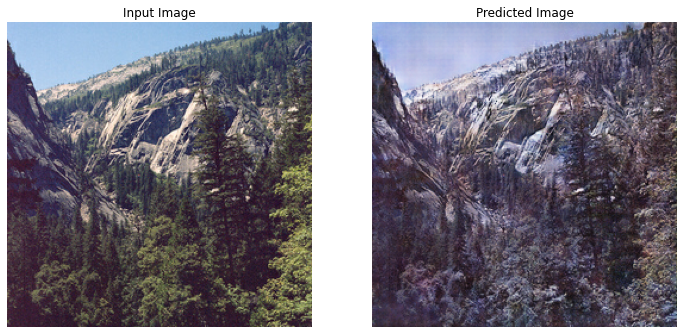

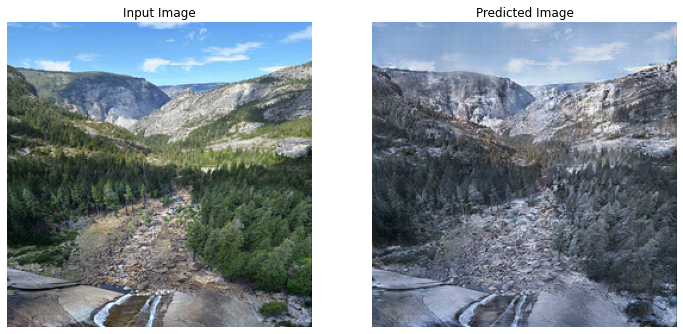

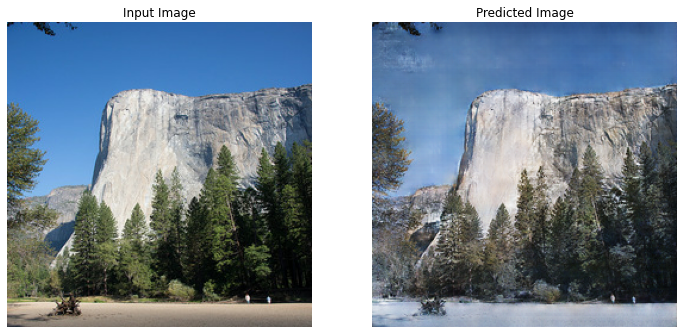

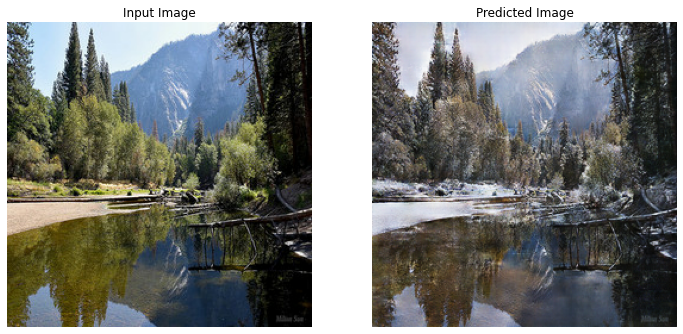

In [26]:
for inp in test_summers.take(20):
    generate_images(generator_g, inp)